In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

## NEED TO SET UP meas_modelfit *before starting ipython* for code at bottom (not included in lsst_apps!)

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10), 
                         #varFlux2=np.repeat(620*np.sqrt(2), 20),
                         n_sources=600, verbose=True, sourceFluxRange=(2000., 120000.), 
                         variablesAvoidBorder=3.5, psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
('HERE:', 119825.70335017775, 2000.0)
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 9 368.142255845 52.2977464926 0 5000
Variable source: 3 437.677528631 394.051374239 0 5000
Variable source: 7 77.2355874401 392.237254371 0 5000
Variable source: 10 66.5809759253 363.20308398 0 5000
Variable source: 6 352.24315562 433.633351478 0 5000
Variable source: 1 237.897633976 429.430670374 0 5000
Variable source: 11 89.7121431268 243.982084998 0 5000
Variable source: 2 260.515557753 389.705213876 0 5000
Variable source: 8 184.879430277 305.582257912 0 5000
Variable source: 0 300.731568916 220.088731954 0 5000
{'Zogy': {'FP': 39, 'FN': 0, 'TP': 10}, 'ALstack': {'FP': 3, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 32, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}


In [3]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.pipe.base as pipeBase
import lsst.ip.diffim as ipDiffim

In [4]:
config = dit.DecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'returnSubImages': False, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [5]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()

In [6]:
exposure2 = testObj.im2.asAfwExposure()
obj = dit.tasks.PsfMeasurement(exposure2)
obj.run()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
obj = dit.tasks.PsfMeasurement(template2)
obj.run()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

529
540


In [7]:
ALres = dit.tasks.doAlInStack(template2, exposure2, doWarping=False, doDecorr=True, doPreConv=False,
            spatialBackgroundOrder=0, spatialKernelOrder=2)

In [8]:
newExpC = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True).exposure

Grid parameters: 46 46 41.8671875 41.8671875 14 14


diffimTests/imageMapReduce.py:283: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:284: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [9]:
testObj2 = testObj.clone()
testObj2.ALres.decorrelatedDiffim = newExpC
testObj2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 3, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 32, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 39, 'TP': 10}}

Finally, let's compare it to spatially-varying ZOGY!

NOTE that the `gridStep/gridSize` combo doesn't seem to correctly fully cover the entire image in all cases! In this case (the default), it does, but if I uncomment the 'gridStep' setting line below, it doesn't.

In [10]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'returnSubImages': False, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [11]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

Grid parameters: 46 46 37.31640625 37.31640625 14 14


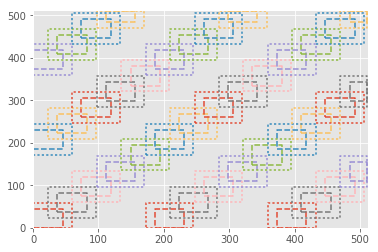

In [12]:
task.plotBoxes(exposure2.getBBox(), skip=5)

In [13]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ
testObj3.S_Zogy = newExpZ_Scorr
testObj3.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 3, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 0, 'TP': 10}}

A&L(dec): stats(mean=0.088057078, stdev=24.660915, min=-205.98235, max=319.60083)
Zogy: stats(mean=0.082778402, stdev=24.806717, min=-1127.9281, max=695.49487)
A&L(dec) - Zogy: stats(mean=0.018669222, stdev=29.664328, min=-383.20789, max=207.43701)
A&L(dec) - A&L: stats(mean=-0.032470942, stdev=6.8277187, min=-52.782883, max=60.620834)
Scorr: stats(mean=3.6753529e-06, stdev=0.00024940414, min=-0.0045673479, max=0.01523129)
Scorr_var: stats(mean=0.00024792145, stdev=1.5238489e-05, min=0.00021651732, max=0.00093122548)


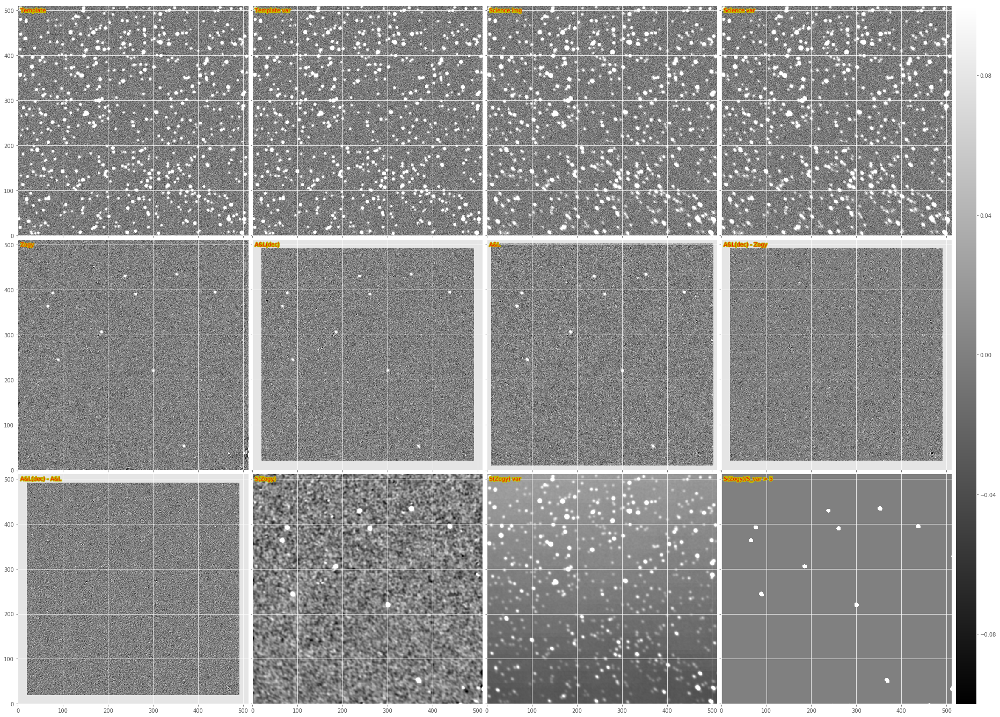

In [14]:
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

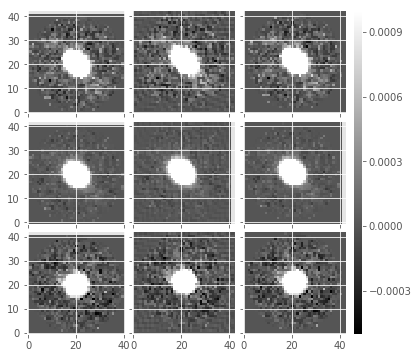

In [15]:
def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
    
dit.plotImageGrid((gp(exposure2, [80,80]), gp(newExpC, [80,80]), gp(newExpZ, [80,80]),
                   gp(exposure2, [255,255]), gp(newExpC, [255,255]), gp(newExpZ, [255,255]),
                   gp(exposure2, [480,480]), gp(newExpC, [480,480]), gp(newExpZ, [480,480]),), 
                  clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

`inImageSpace = True`

Need to increase the border size

Definitely takes a while!

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'returnSubImages': False, 'gridSizeX': 12.0, 'gridSizeY': 12.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 55 55 36.595703125 36.595703125 23 23


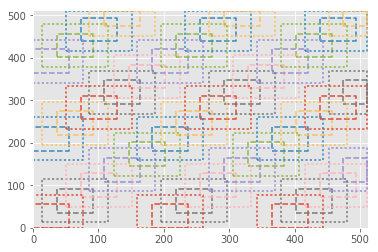

In [145]:
reload(dit)

config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
config.gridSizeX = config.gridSizeY = 12
config.borderSizeX = config.borderSizeY = 5
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=5)

In [146]:
newExpZIS = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure
#newExpZIS_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

In [147]:
testObj3IS = testObj.clone()
testObj3IS.ALres.decorrelatedDiffim = newExpC
testObj3IS.D_Zogy = newExpZIS  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS.runTest(spatialKernelOrder=2)
# testObj3IS.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

{'ALstack': {'FN': 0, 'FP': 3, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 32, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 2, 'TP': 10}}

stats(mean=-0.017340269, stdev=2.2554703, min=-55.454453, max=43.275635)


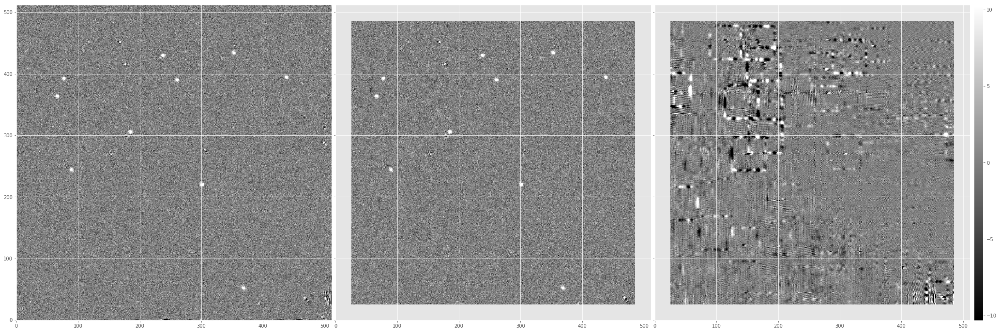

In [148]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS), ga(newExpZ)-ga(newExpZIS)), imScale=12)

Try to add more PSF padding...  also need to increase the border size...

This all makes it a *lot* slower.

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'returnSubImages': False, 'gridSizeX': 12.0, 'gridSizeY': 12.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 7.0, 'borderSizeY': 7.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 55 55 36.595703125 36.595703125 32 32


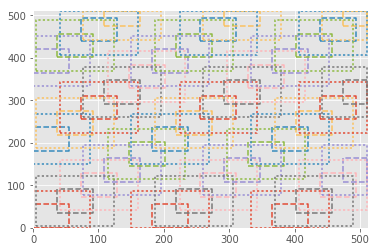

In [149]:
reload(dit)

config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
config.gridSizeX = config.gridSizeY = 12
config.borderSizeX = config.borderSizeY = 7
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=5)

In [150]:
newExpZIS = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True, padSize=15).exposure
#newExpZIS_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

In [151]:
testObj3IS = testObj.clone()
testObj3IS.ALres.decorrelatedDiffim = newExpC
testObj3IS.D_Zogy = newExpZIS  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS.runTest(spatialKernelOrder=2)
# testObj3IS.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

{'ALstack': {'FN': 0, 'FP': 3, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 32, 'TP': 10},
 'Zogy': {'FN': 1, 'FP': 0, 'TP': 9}}

stats(mean=0.019003313, stdev=1.9384576, min=-55.076248, max=30.230858)


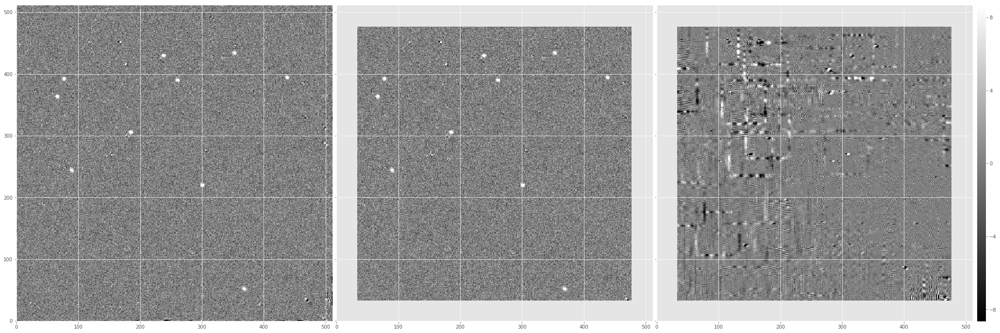

In [152]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS), ga(newExpZ)-ga(newExpZIS)), imScale=12)

Let's look at individual stamps to see what's going on...

In [153]:
reload(dit)

config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
config.gridSizeX = config.gridSizeY = 12
config.borderSizeX = config.borderSizeY = 7
config.reducerSubtask.reduceOperation = 'average'

In [154]:
config.returnSubImages = True
config.reducerSubtask.reduceOperation = 'none'
task = dit.ImageMapReduceTask(config=config)
print config
#task._generateGrid(exposure2, forceEvenSized=True)
#task.plotBoxes(exposure2.getBBox(), skip=5)

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'returnSubImages': True, 'gridSizeX': 12.0, 'gridSizeY': 12.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'none'}, 'adjustGridOption': 'spacing', 'borderSizeX': 7.0, 'borderSizeY': 7.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [155]:
resF = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True, returnInputs=True)
resI = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True, padSize=15, returnInputs=True)

Grid parameters: 55 55 36.595703125 36.595703125 32 32


['inputSubExposure', 'inputExpandedSubExposure', 'subvar1', 'subvar2', 'subarr2', 'subarr1', 'sig1', 'subExposure', 'sig2', 'psf1', 'psf2']
0.680172918394 49
0.0 0
49
stats(mean=0.38888195, stdev=25.260698, min=-114.19439, max=138.88019)
stats(mean=1.0393256, stdev=25.04171, min=-114.65479, max=138.0549)
stats(mean=-0.4073464, stdev=1.7064022, min=-11.275045, max=8.8709049)
(minimum=(109, 256), maximum=(164, 311))


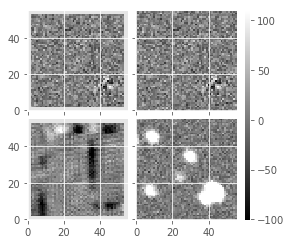

In [164]:
res = resI.result[0]
print res.getDict().keys()

def diff(resI, resF):
    imI = resI.subExposure.getMaskedImage().getImage().getArray()
    imF = resF.subExposure.getMaskedImage().getImage().getArray()
    dif = np.abs(np.nansum(imI - imF) / np.sum(~np.isnan(imI + imF)))
    #print dif
    if np.mean(np.isnan(imI + imF)) > 0.5:  # lets just skip subimages near edges for now
        dif = 0  # 1e9  # 0
    return dif

diffs = np.array([diff(resI.result[i], resF.result[i]) for i in range(len(resI.result))])
print diffs.max(), np.argmax(diffs)
print diffs.min(), np.argmin(diffs)

i = np.argmax(diffs)
#i = np.argmin(diffs)
print i
imI = resI.result[i].subExposure.getMaskedImage().getImage().getArray()
imF = resF.result[i].subExposure.getMaskedImage().getImage().getArray()
inp = resI.result[i].inputSubExposure.getMaskedImage().getImage().getArray()
dit.plotImageGrid((imI, imF, imI - imF, inp))
print dit.computeClippedImageStats(imI)
print dit.computeClippedImageStats(imF)
print dit.computeClippedImageStats(imI-imF)
print resI.result[i].subExposure.getBBox()

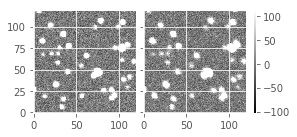

In [165]:
# Look at what's going on with the conv. kernels for this subExposure
ri = resI.result[i]
im1_var, im2_var, im2, im1, sig1, _, sig2, im1_psf, im2_psf = \
    ri.subvar1, ri.subvar2, ri.subarr2, ri.subarr1, ri.sig1, ri.subExposure, ri.sig2, \
    ri.psf1, ri.psf2
dit.plotImageGrid((im1, im2))

17.3738 17.4198 17.3205080757


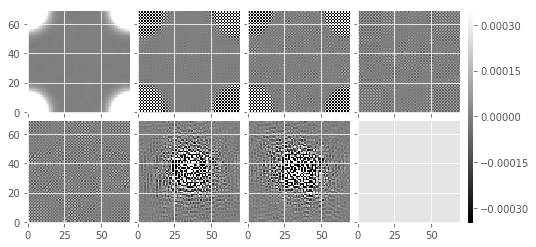

In [167]:
print sig1, sig2, np.sqrt(300.)
#sig1 = sig2 = np.sqrt(300.)
#print sig1, sig2

prereqs = dit.zogy.computeZogyPrereqs(im1, im2, im1_psf, im2_psf,
                                      sig1, sig2, Fr=1., Fn=1., padSize=15)
Pr_hat, Pn_hat, denom, padded_psf1, padded_psf2, Fd = (prereqs[key] for key in
    ['Pr_hat', 'Pn_hat', 'denom', 'Pr', 'Pn', 'Fd'])

delta = 0 #.01
Kr_hat = (Pr_hat + delta) / (denom + delta)
Kn_hat = (Pn_hat + delta) / (denom + delta)
Kr = np.fft.ifft2(Kr_hat).real
Kn = np.fft.ifft2(Kn_hat).real
dit.plotImageGrid((denom.real, Pr_hat.real, Pn_hat.real, Kr_hat.real, Kn_hat.real, Kr, Kn))

stats(mean=0.38888195, stdev=25.260698, min=-114.19439, max=138.88019)
stats(mean=1.7256033, stdev=32.799763, min=-935.49945, max=645.98041)


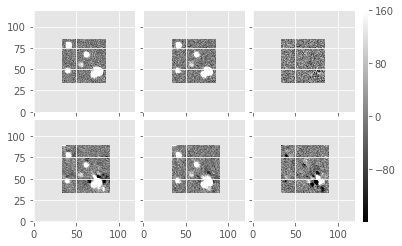

In [168]:
import scipy
im1c = scipy.ndimage.filters.convolve(im1, Kn, mode='constant', cval=np.nan)
im2c = scipy.ndimage.filters.convolve(im2, Kr, mode='constant', cval=np.nan)
D = (im2c - im1c) / Fd

Kn2 = Kn.copy()
Knsum = Kn.mean()
Kn2[0:5, :] = Kn2[:, 0:5] = Kn2[36:41, :] = Kn2[:, 36:41] = 0
Kn2 *= Knsum / Kn2.mean()
Kr2 = Kr.copy()
Krsum = Kr.mean()
Kr2[0:5, :] = Kr2[:, 0:5] = Kr2[36:41, :] = Kr2[:, 36:41] = 0
Kr2 *= Krsum / Kr2.mean()
im1c2 = scipy.ndimage.filters.convolve(im1, Kn2, mode='constant', cval=np.nan)
im2c2 = scipy.ndimage.filters.convolve(im2, Kr2, mode='constant', cval=np.nan)
D2 = (im2c2 - im1c2) / Fd

print dit.computeClippedImageStats(D)
print dit.computeClippedImageStats(D2)
dit.plotImageGrid((im1c, im2c, D, im1c2, im2c2, D2))

In [131]:
# After adding this to `zogy.computeZogyImageSpace`:
# Never mind, this doesn't help. Comment it all out.

reload(dit)

config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
config.gridSizeX = config.gridSizeY = 12
config.borderSizeX = config.borderSizeY = 5
config.reducerSubtask.reduceOperation = 'average'

task = dit.ImageMapReduceTask(config=config)
print config

newExpZIS_new = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'returnSubImages': False, 'gridSizeX': 12.0, 'gridSizeY': 12.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 55 55 36.595703125 36.595703125 23 23


stats(mean=0.1971781, stdev=3.8378298, min=-76.829063, max=347.66156)


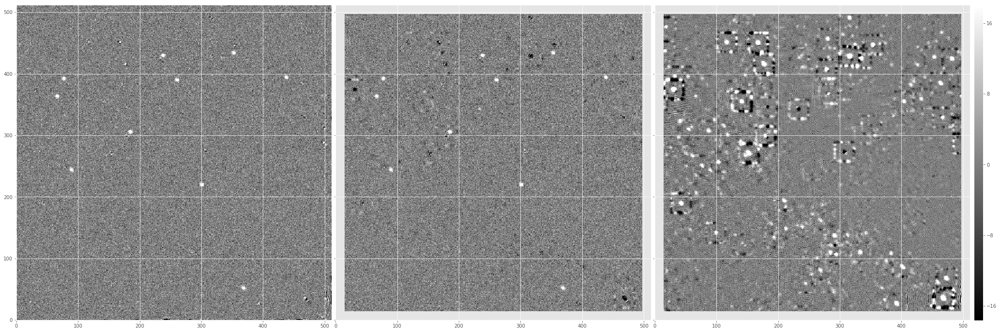

In [132]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS_new))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS_new), ga(newExpZ)-ga(newExpZIS_new)), imScale=12)

In [44]:
import lsst.afw.geom as afwGeom

exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

exposure.setPsf(testObj.variablePsf.getCoaddPsf(exposure))

In [45]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
config.gridSizeX = config.gridSizeY = 12
config.borderSizeX = config.borderSizeY = 5
config.reducerSubtask.reduceOperation = 'average'

task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'returnSubImages': False, 'gridSizeX': 12.0, 'gridSizeY': 12.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [46]:
#newExp_Scorr = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf,
#                       Scorr=True, forceEvenSized=True).exposure
newExp_Ispace = task.run(exposure, template=template, inImageSpace=True, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure, template=template, inImageSpace=False, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure

Grid parameters: 62 62 40.4296875 40.4296875 26 26


stats(mean=0.058705989, stdev=24.660292, min=-241.91339, max=326.07837)
stats(mean=0.0053143473, stdev=24.699257, min=-580.10791, max=326.07886)
stats(mean=-0.00012292083, stdev=0.0041717896, min=-0.86391807, max=0.81742203)


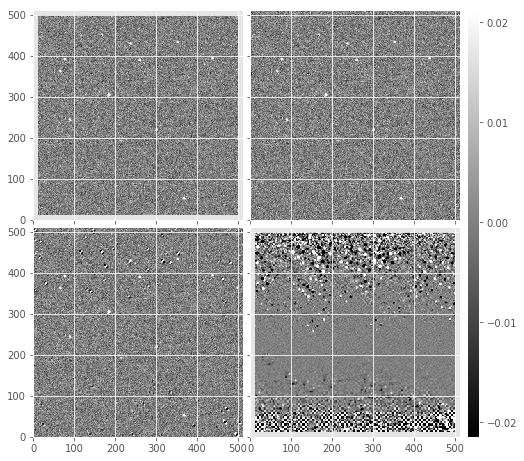

In [47]:
#Sim = ga(newExp_Scorr)
#Svar = newExp_Scorr.getMaskedImage().getVariance().getArray()
#print dit.computeClippedImageStats(Sim-testObj.S_Zogy.im)
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

In [48]:
newExp_Ispace = task.run(exposure2, template=template2, inImageSpace=True, 
                       Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure2, template=template2, inImageSpace=False, 
                       Scorr=False, forceEvenSized=True).exposure

stats(mean=-0.36375871, stdev=24.713224, min=-153.08195, max=311.32953)
stats(mean=0.073233828, stdev=24.748217, min=-432.90601, max=310.6532)
stats(mean=-0.38084611, stdev=2.1807554, min=-48.545101, max=44.00515)


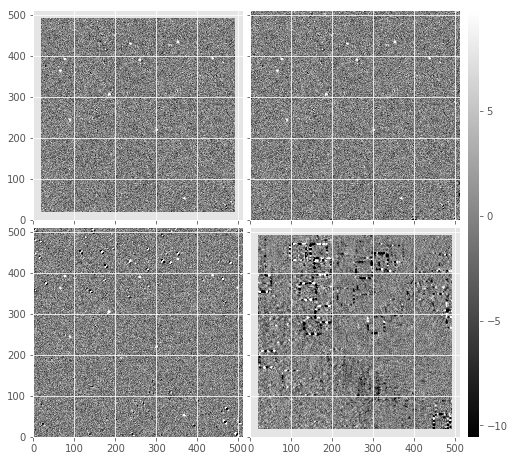

In [49]:
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

Try different `padSize`s -- zero is worse. Try 20. 20 is slightly better than the default of 7.

In [50]:
reload(dit)

newExp_Ispace = task.run(exposure2, template=template2, inImageSpace=True, 
                       Scorr=False, forceEvenSized=True, padSize=20).exposure

stats(mean=-0.36343792, stdev=24.698389, min=-151.96555, max=311.15518)
stats(mean=0.073233828, stdev=24.748217, min=-432.90601, max=310.6532)
stats(mean=-0.37322545, stdev=2.0847208, min=-48.028469, max=43.492439)


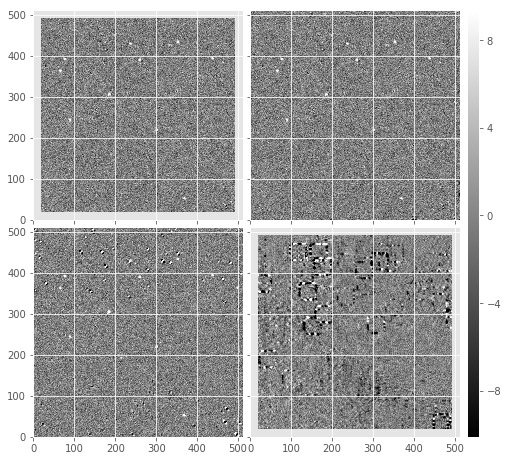

In [51]:
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

Looks like we may need to make a smoother approximation to the PSF at each point.

Jim pointed me to `DoubleShapeletPsfApprox` -- look at `testForcedPlugin` in `meas_modelfit/tests/testDoubleShapeletPsfApprox.py`...

In [ ]:
import os
import lsst.meas.modelfit as meas_modelfit
import lsst.afw.image as afwImage
import testDoubleShapeletPsfApprox as td
reload(td);

In [ ]:
import lsst.utils.tests

class HigherOrderTestCase0(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self):
        np.random.seed(500)
        image = afwImage.ImageD(os.path.join("data", "psfs/great3-0.fits"))
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=3, outerOrder=2,
            atol=0.0005
        )

tc = HigherOrderTestCase0()
tc.setUp()
dit.plotImageGrid((tc.psf,))
msf = tc.testFitShapelets()

In [ ]:
dataImage, modelImage = tc.makeImages(msf)
print type(dataImage), type(modelImage)
print dit.computeClippedImageStats(dataImage.getArray()-modelImage.getArray())
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

Now try it on my image's psfs!

In [ ]:
import lsst.afw.geom as afwGeom

def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
def gp2(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1]))
        
dit.plotImageGrid((gp(exposure2, [80,80]), gp(exposure2, [255,255]), gp(exposure2, [480,480])))
#                   clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

tc.setImage(gp2(exposure2, [80,80]))

In [ ]:
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

See if any other models get rid of those wings!

In [ ]:
class SingleGaussianTestCase(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=lsst.afw.detection.GaussianPsf(25, 25, 2.0),
            innerOrder=0, outerOrder=0, peakRatio=0.0)
        self.setImage(image)

class HigherOrderTestCase0(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=3, outerOrder=2,
            atol=0.0005)
        self.setImage(image)

class HigherOrderTestCase1(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=2, outerOrder=1,
            atol=0.002)
        self.setImage(image)

In [ ]:
tc = SingleGaussianTestCase()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

In [ ]:
tc = HigherOrderTestCase0()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

In [ ]:
tc = HigherOrderTestCase1()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

In [ ]:
def toTime(psf):
    tc = HigherOrderTestCase0()
    tc.setUp(psf)
    msf = tc.testFitShapelets()
    dataImage, modelImage = tc.makeImages(msf)

psf = gp2(exposure2, [80,80])
%timeit toTime(psf)

In [ ]:
def toTime(psf):
    tc = HigherOrderTestCase1()
    tc.setUp(psf)
    msf = tc.testFitShapelets()
    dataImage, modelImage = tc.makeImages(msf)

psf = gp2(exposure2, [80,80])
%timeit toTime(psf)

In [ ]:
dit.plotImageGrid((exposure2.getPsf().computeImage(afwGeom.Point2D(0,0)),))

# psf goes from [1.8, 2.2-0.5] to [1.8, 2.2+0.5] = [1.8, 2.7]
print 1-1.8/2.7

In [ ]:
import math

shape = exposure2.getPsf().computeShape(afwGeom.Point2D(0,0))
print shape
Ixx, Iyy, Ixy = shape.getIxx(), shape.getIyy(), shape.getIxy()
ePlus = (Ixx - Iyy) / (Ixx + Iyy)
eMinus =    2 * Ixy / (Ixx + Ixy)
print ePlus, eMinus
ellipticity = np.sqrt(ePlus**2 + eMinus**2)
angle = math.degrees(math.atan(eMinus/ePlus)/2.)
print ellipticity, angle
print shape.getParameterVector()
print shape.getDeterminantRadius()
print shape.getDeterminantRadius()*(1+(ellipticity-1)/2)
print shape.getDeterminantRadius()*(1-(ellipticity-1)/2)

In [ ]:
modelKernel = lsst.afw.math.FixedKernel(modelImage)
modelPsf = lsst.meas.algorithms.KernelPsf(modelKernel)

shape = modelPsf.computeShape()
shape = exposure2.getPsf().computeShape(afwGeom.Point2D(0,0))
print shape
Ixx, Iyy, Ixy = shape.getIxx(), shape.getIyy(), shape.getIxy()
ePlus = (Ixx - Iyy) / (Ixx + Iyy)
eMinus =    2 * Ixy / (Ixx + Iyy)
print ePlus, eMinus
ellipticity = np.sqrt(ePlus**2 + eMinus**2)
theta = math.atan(eMinus/ePlus)/2.
print ellipticity, math.degrees(theta)

# So b/a = 1-ellipticity
print 1-ellipticity, 1.8/2.7, shape.getDeterminantRadius(), (1.8+2.7)/2
print shape.getDeterminantRadius()*(1-ellipticity/2)
print shape.getDeterminantRadius()/(1-ellipticity/2)

see https://www.kaggle.com/c/mdm/details/ellipticity

In [ ]:
e1 = (Ixx - Iyy) / (Ixx + Iyy + 2.*np.sqrt(Ixx*Iyy - Ixy**2))
e2 =     2 * Ixy / (Ixx + Iyy + 2.*np.sqrt(Ixx*Iyy - Ixy**2))
print e1, e2
ellipticity = np.sqrt(e1**2 + e2**2)
theta = math.atan(e2/e1)/2.
print ellipticity, math.degrees(theta)

# So b/a = 1-2*ellipticity
print 1-2*ellipticity, 1.8/2.7

# FWHMs of two axes are:
print 

In [ ]:
I = exposure2.getPsf().computeImage(afwGeom.Point2D(80,80)).getArray()
#I = modelImage.getArray()
x, y = np.meshgrid(np.arange(0, I.shape[0]), 
                   np.arange(0, I.shape[1]))
Isum = np.sum(I)
xBar = np.sum(x * I) / Isum
yBar = np.sum(y * I) / Isum
print xBar, yBar

Q11 = np.sum(I * (xBar - x) * (xBar - x)) / wsum
Q12 = np.sum(I * (xBar - x) * (yBar - y)) / wsum
Q22 = np.sum(I * (yBar - y) * (yBar - y)) / wsum
print Q11, Q12, Q22

e1 = (Q11 - Q22) / (Q11 + Q22 + 2*np.sqrt(Q11*Q22 - Q12**2))
e2 =     2 * Q12 / (Q11 + Q22 + 2*np.sqrt(Q11*Q22 - Q12**2))
print e1, e2
ellipticity = np.sqrt(e1**2 + e2**2)
theta = math.atan(e2/e1)/2.
print ellipticity, math.degrees(theta)

In [ ]:
ePlus = (Q11 - Q22) / (Q11 + Q22)
eMinus =    2 * Q12 / (Q11 + Q22)
print ePlus, eMinus
ellipticity = np.sqrt(ePlus**2 + eMinus**2)
theta = math.atan(eMinus/ePlus)/2.
print ellipticity, math.degrees(theta)

# So b/a = 1-ellipticity
print 1-ellipticity, 1.8/2.7

In [ ]:
def getPsfParameters(psf, coord):
    """ Return PSF parameters that can go into GaussianFunction2"""
    shape = psf.computeShape(afwGeom.Point2D(coord[0], coord[1]))
    print shape
    Ixx, Iyy, Ixy = shape.getIxx(), shape.getIyy(), shape.getIxy()
    ePlus = (Ixx - Iyy) / (Ixx + Iyy)
    eMinus =    2 * Ixy / (Ixx + Ixy)
    #print ePlus, eMinus
    ellipticity = np.sqrt(ePlus**2 + eMinus**2)
    print ellipticity
    angle = math.atan(eMinus/ePlus)/2.
    #print ellipticity, angle
    #print shape.getParameterVector()
    #print shape.getDeterminantRadius()
    #print shape.getDeterminantRadius()*(1+(ellipticity-1)/2)
    #print shape.getDeterminantRadius()*(1-(ellipticity-1)/2)
    return shape.getDeterminantRadius()*(1+(ellipticity-1)/2), \
        shape.getDeterminantRadius()*(1-(ellipticity-1)/2), angle
    
params = getPsfParameters(exposure2.getPsf(), [0,0])
print params, math.degrees(params[2])

In [ ]:
import lsst.afw.math as afwMath
f2 = afwMath.GaussianFunction2D(params[0], params[1], params[2])
f2(0, 0)

In [ ]:
x, y = np.meshgrid(np.arange(-20, 20, dtype=float), 
                   np.arange(-20, 20, dtype=float))
shape = x.shape
x = x.flatten()
y = y.flatten()
vals = np.array([f2(x[i], y[i]) for i in range(len(x))])

In [ ]:
print vals.shape, x.shape, shape
vals = np.reshape(vals, shape)
dit.plotImageGrid((vals, exposure2.getPsf().computeImage(afwGeom.Point2D(0,0)).getArray()))

In [ ]:
def makeGaussianPsf(psf, coords):
    params = getPsfParameters(psf, coords)
    print params
    f2 = afwMath.GaussianFunction2D(params[0], params[1], params[2])
    x, y = np.meshgrid(np.arange(-20, 20, dtype=float), 
                       np.arange(-20, 20, dtype=float))
    shape = x.shape
    x = x.flatten()
    y = y.flatten()
    vals = np.array([f2(x[i], y[i]) for i in range(len(x))])
    vals = np.reshape(vals, shape)
    return vals

dit.plotImageGrid((makeGaussianPsf(exposure2.getPsf(), [0,0]),
                  exposure2.getPsf().computeImage(afwGeom.Point2D(0,0)).getArray(),
                  makeGaussianPsf(exposure2.getPsf(), [255,255]),
                  exposure2.getPsf().computeImage(afwGeom.Point2D(255,255)).getArray(),
                  makeGaussianPsf(exposure2.getPsf(), [512,512]),
                  exposure2.getPsf().computeImage(afwGeom.Point2D(512,512)).getArray()))

In [ ]:
[1.8, 2.2-0.5] to [1.8, 2.2+0.5] = [1.8, 2.7]
# [1.8, 1.7]
# e = 0.056576715427; shape = exposure2.getPsf().computeShape(afwGeom.Point2D(512,512))
# [1.8, 2.2]
#e = 0.436852653873; shape = exposure2.getPsf().computeShape(afwGeom.Point2D(255,255))
# [1.8, 2.7]
#e = 1.37745580316; shape = exposure2.getPsf().computeShape(afwGeom.Point2D(0,0))

rad = shape.getDeterminantRadius()
print rad, 1+(e-1)/2, 1-(e-1)/2
print rad*(1+e), rad/(1+e)
print rad*(1+(e-1)/2), rad*(1-(e-1)/2)
print 1/np.sqrt((e+1)**2-1)  # a/b

In [ ]:
print 1.7/1.8  # e = 0.056576715427
print 1.8/2.2  # e = 0.436852653873
print 1.8/2.7  # e = 1.37745580316